# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

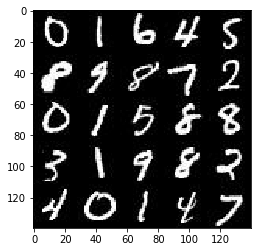

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

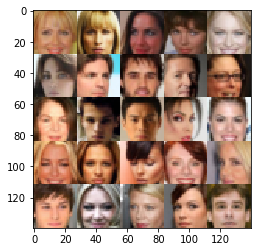

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # DONE: Implement Function
    
    tensor_input_images = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels])
    tensor_z = tf.placeholder(tf.float32, [None, z_dim])
    lr = tf.placeholder(tf.float32)

    return tensor_input_images, tensor_z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
alpha_ = 0.01

def discriminator(images, reuse=False, alpha=alpha_):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # DONE: Implement Function
    
    def conv_layer(inputs, depth, bn=True):
        conv = tf.layers.conv2d(inputs, depth, 5, strides=2, padding='same')
        if bn:
            conv = tf.layers.batch_normalization(conv, training=True)
        return tf.maximum(conv*alpha, conv)
    
    with tf.variable_scope("discriminator", reuse=reuse):
        #input: 28x28x3
        
        # Conv 1 
        conv1 = conv_layer(images, 64, bn=False)
        
        # Conv 3
        conv2 = conv_layer(conv1, 128)
        
        # Conv 4
        conv3 = conv_layer(conv2, 256)
        
        # flatten
        flat = tf.contrib.layers.flatten(conv3)
        logits = tf.layers.dense(flat,1)
        out = tf.sigmoid(logits)
    
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=alpha_):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # DONE: Implement Function
    
    def transpose_layer(inputs, depth, strides=2, bn=True):
        conv = tf.layers.conv2d_transpose(inputs, depth, 3, strides=strides, padding='same')
        if bn:
            conv = tf.layers.batch_normalization(conv, training=is_train)
        conv = tf.maximum(alpha*conv, conv)
        return conv
    
    reuse = not is_train
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        fc = tf.layers.dense(z, 7*7*512)
        fc = tf.reshape(fc, (-1, 7, 7, 512))
        fc = tf.layers.batch_normalization(fc, training=is_train)
        fc = tf.maximum(alpha*fc, fc)
        # 7x7x512
        
        conv1 = transpose_layer(fc, 256, strides=1)
        # 7x7x256
        
        conv2 = transpose_layer(conv1, 128)
        # 14x14x128
        
        # Output layer
        logits = tf.layers.conv2d_transpose(conv2, out_channel_dim, 5, strides=2, padding='same')
        out = tf.tanh(logits)
        # 28*28*out_channel_dim
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim, smooth=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # DONE: Implement Function
    
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*(1-smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # DONE: Implement Function
    
    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        t_vars = tf.trainable_variables()
        d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
        g_vars = [var for var in t_vars if var.name.startswith('generator')]
        
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    pyplot.rcParams["figure.figsize"] = [8,8]
    
    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # DONE: Build Model
    
    # data_shape: number_of_datapoints x image_width x image_height x image_channels
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            batch_i = 0
            for batch_images in get_batches(batch_size):
                # DONE: Train Model
                
                batch_i += 1
                
                batch_z = np.random.uniform(-1,1, size=(batch_size, z_dim))
                batch_images = batch_images*2 # this is important because the range of values in images are from -0.5 to 0.5
                
                sess.run(d_opt, feed_dict={input_real:batch_images, input_z:batch_z, lr:learning_rate})
                sess.run(g_opt, feed_dict={input_real:batch_images, input_z:batch_z, lr:learning_rate})
                
                if batch_i % 5 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Batch {}".format(batch_i),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                
                if batch_i % 50 == 0:
                    show_generator_output(sess, batch_size, input_z, data_shape[3], data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Batch 5 Discriminator Loss: 1.2365... Generator Loss: 4.5618
Epoch 1/2... Batch 10 Discriminator Loss: 2.4202... Generator Loss: 6.7534
Epoch 1/2... Batch 15 Discriminator Loss: 1.0636... Generator Loss: 0.8208
Epoch 1/2... Batch 20 Discriminator Loss: 1.9385... Generator Loss: 0.4936
Epoch 1/2... Batch 25 Discriminator Loss: 1.7850... Generator Loss: 0.7220
Epoch 1/2... Batch 30 Discriminator Loss: 1.1504... Generator Loss: 1.0138
Epoch 1/2... Batch 35 Discriminator Loss: 1.3532... Generator Loss: 3.0123
Epoch 1/2... Batch 40 Discriminator Loss: 1.7506... Generator Loss: 0.6201
Epoch 1/2... Batch 45 Discriminator Loss: 1.3491... Generator Loss: 0.6088
Epoch 1/2... Batch 50 Discriminator Loss: 1.2874... Generator Loss: 0.8651


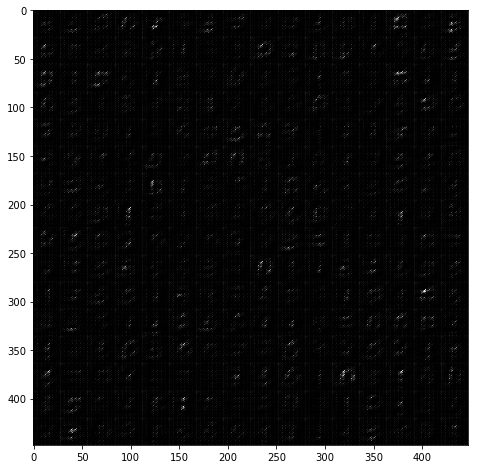

Epoch 1/2... Batch 55 Discriminator Loss: 1.8000... Generator Loss: 1.9393
Epoch 1/2... Batch 60 Discriminator Loss: 1.2758... Generator Loss: 0.9534
Epoch 1/2... Batch 65 Discriminator Loss: 1.0861... Generator Loss: 1.5423
Epoch 1/2... Batch 70 Discriminator Loss: 1.4816... Generator Loss: 0.7036
Epoch 1/2... Batch 75 Discriminator Loss: 1.2934... Generator Loss: 0.7632
Epoch 1/2... Batch 80 Discriminator Loss: 1.7858... Generator Loss: 1.9601
Epoch 1/2... Batch 85 Discriminator Loss: 1.3568... Generator Loss: 0.8701
Epoch 1/2... Batch 90 Discriminator Loss: 1.3421... Generator Loss: 0.6302
Epoch 1/2... Batch 95 Discriminator Loss: 1.4128... Generator Loss: 1.5344
Epoch 1/2... Batch 100 Discriminator Loss: 1.2694... Generator Loss: 0.7812


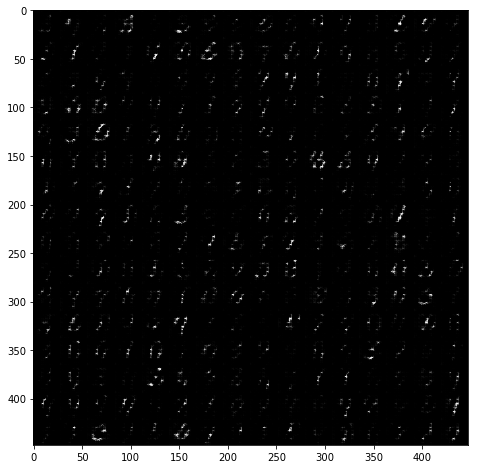

Epoch 1/2... Batch 105 Discriminator Loss: 1.5966... Generator Loss: 2.4211
Epoch 1/2... Batch 110 Discriminator Loss: 1.2032... Generator Loss: 0.9908
Epoch 1/2... Batch 115 Discriminator Loss: 1.4606... Generator Loss: 1.8837
Epoch 1/2... Batch 120 Discriminator Loss: 1.3259... Generator Loss: 0.7486
Epoch 1/2... Batch 125 Discriminator Loss: 1.6425... Generator Loss: 2.0644
Epoch 1/2... Batch 130 Discriminator Loss: 1.2554... Generator Loss: 0.9016
Epoch 1/2... Batch 135 Discriminator Loss: 1.4073... Generator Loss: 1.0439
Epoch 1/2... Batch 140 Discriminator Loss: 1.4554... Generator Loss: 0.5796
Epoch 1/2... Batch 145 Discriminator Loss: 1.3873... Generator Loss: 0.6044
Epoch 1/2... Batch 150 Discriminator Loss: 1.3241... Generator Loss: 1.2737


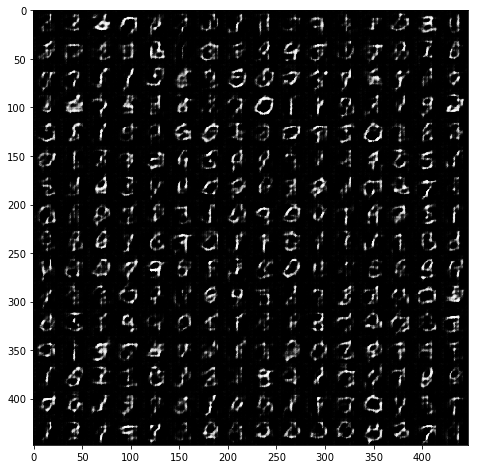

Epoch 1/2... Batch 155 Discriminator Loss: 1.2791... Generator Loss: 0.5900
Epoch 1/2... Batch 160 Discriminator Loss: 1.5003... Generator Loss: 1.5360
Epoch 1/2... Batch 165 Discriminator Loss: 1.4212... Generator Loss: 1.2819
Epoch 1/2... Batch 170 Discriminator Loss: 1.2235... Generator Loss: 0.7710
Epoch 1/2... Batch 175 Discriminator Loss: 1.4506... Generator Loss: 0.4866
Epoch 1/2... Batch 180 Discriminator Loss: 1.3286... Generator Loss: 1.0882
Epoch 1/2... Batch 185 Discriminator Loss: 1.3101... Generator Loss: 0.7819
Epoch 1/2... Batch 190 Discriminator Loss: 1.4555... Generator Loss: 0.5101
Epoch 1/2... Batch 195 Discriminator Loss: 1.2307... Generator Loss: 1.1327
Epoch 1/2... Batch 200 Discriminator Loss: 1.2459... Generator Loss: 1.2563


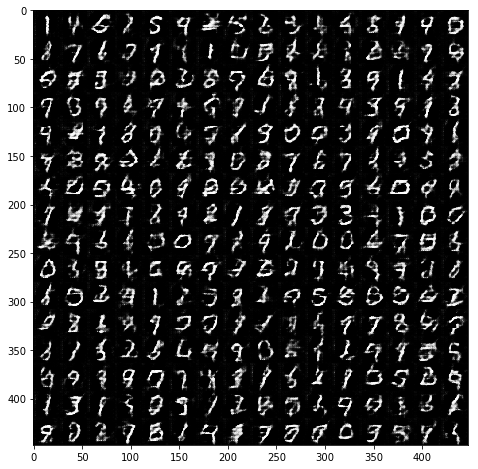

Epoch 1/2... Batch 205 Discriminator Loss: 1.3444... Generator Loss: 0.5864
Epoch 1/2... Batch 210 Discriminator Loss: 1.4850... Generator Loss: 1.9590
Epoch 1/2... Batch 215 Discriminator Loss: 1.2770... Generator Loss: 0.6763
Epoch 1/2... Batch 220 Discriminator Loss: 1.2397... Generator Loss: 1.3373
Epoch 1/2... Batch 225 Discriminator Loss: 1.2111... Generator Loss: 1.2451
Epoch 1/2... Batch 230 Discriminator Loss: 1.2098... Generator Loss: 0.8003
Epoch 2/2... Batch 5 Discriminator Loss: 1.2948... Generator Loss: 0.7682
Epoch 2/2... Batch 10 Discriminator Loss: 1.2350... Generator Loss: 1.1165
Epoch 2/2... Batch 15 Discriminator Loss: 1.7103... Generator Loss: 0.3419
Epoch 2/2... Batch 20 Discriminator Loss: 1.3220... Generator Loss: 0.6882
Epoch 2/2... Batch 25 Discriminator Loss: 1.1958... Generator Loss: 1.0009
Epoch 2/2... Batch 30 Discriminator Loss: 1.3309... Generator Loss: 0.6054
Epoch 2/2... Batch 35 Discriminator Loss: 1.2616... Generator Loss: 1.2997
Epoch 2/2... Batch 4

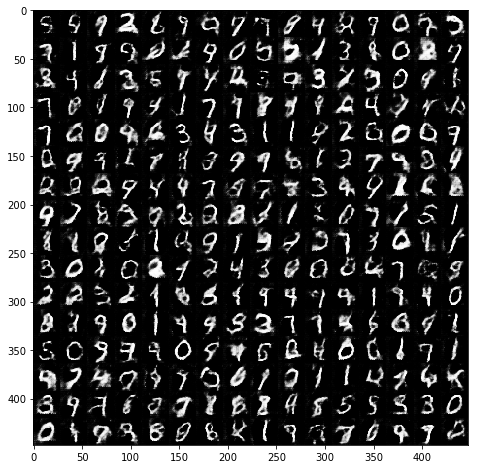

Epoch 2/2... Batch 55 Discriminator Loss: 1.4699... Generator Loss: 0.4839
Epoch 2/2... Batch 60 Discriminator Loss: 1.3190... Generator Loss: 1.5471
Epoch 2/2... Batch 65 Discriminator Loss: 1.2137... Generator Loss: 0.9573
Epoch 2/2... Batch 70 Discriminator Loss: 1.3407... Generator Loss: 0.5828
Epoch 2/2... Batch 75 Discriminator Loss: 1.2716... Generator Loss: 1.5644
Epoch 2/2... Batch 80 Discriminator Loss: 1.3449... Generator Loss: 0.6203
Epoch 2/2... Batch 85 Discriminator Loss: 1.2617... Generator Loss: 1.5295
Epoch 2/2... Batch 90 Discriminator Loss: 1.2540... Generator Loss: 0.9561
Epoch 2/2... Batch 95 Discriminator Loss: 1.5780... Generator Loss: 0.4177
Epoch 2/2... Batch 100 Discriminator Loss: 1.4765... Generator Loss: 1.6390


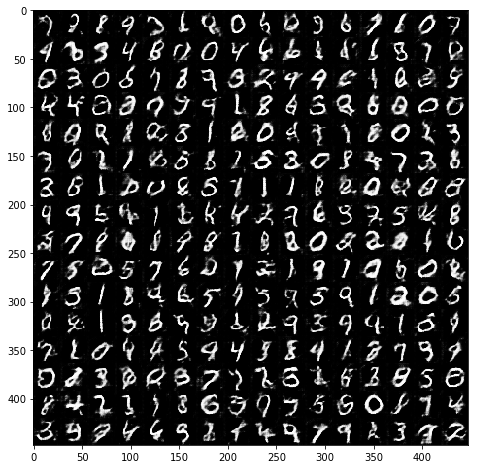

Epoch 2/2... Batch 105 Discriminator Loss: 1.2373... Generator Loss: 1.0574
Epoch 2/2... Batch 110 Discriminator Loss: 1.1799... Generator Loss: 0.8862
Epoch 2/2... Batch 115 Discriminator Loss: 1.4923... Generator Loss: 1.8274
Epoch 2/2... Batch 120 Discriminator Loss: 1.2446... Generator Loss: 1.1462
Epoch 2/2... Batch 125 Discriminator Loss: 1.1662... Generator Loss: 0.8316
Epoch 2/2... Batch 130 Discriminator Loss: 1.6293... Generator Loss: 2.1161
Epoch 2/2... Batch 135 Discriminator Loss: 1.2654... Generator Loss: 0.7742
Epoch 2/2... Batch 140 Discriminator Loss: 1.2544... Generator Loss: 0.9148
Epoch 2/2... Batch 145 Discriminator Loss: 1.3862... Generator Loss: 0.5875
Epoch 2/2... Batch 150 Discriminator Loss: 1.3933... Generator Loss: 1.4214


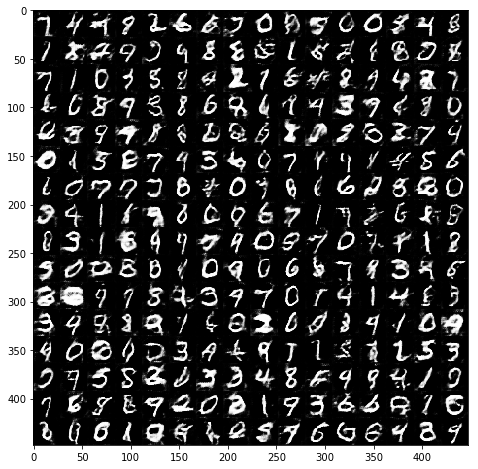

Epoch 2/2... Batch 155 Discriminator Loss: 1.3922... Generator Loss: 0.5767
Epoch 2/2... Batch 160 Discriminator Loss: 1.2797... Generator Loss: 1.0976
Epoch 2/2... Batch 165 Discriminator Loss: 1.6393... Generator Loss: 0.3761
Epoch 2/2... Batch 170 Discriminator Loss: 1.1733... Generator Loss: 0.9813
Epoch 2/2... Batch 175 Discriminator Loss: 1.4003... Generator Loss: 1.7412
Epoch 2/2... Batch 180 Discriminator Loss: 1.2480... Generator Loss: 0.8604
Epoch 2/2... Batch 185 Discriminator Loss: 1.3656... Generator Loss: 0.5587
Epoch 2/2... Batch 190 Discriminator Loss: 1.1972... Generator Loss: 1.1827
Epoch 2/2... Batch 195 Discriminator Loss: 1.5448... Generator Loss: 0.4481
Epoch 2/2... Batch 200 Discriminator Loss: 1.2928... Generator Loss: 0.7870


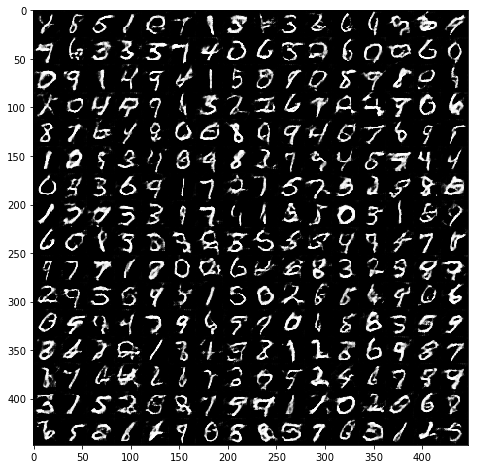

Epoch 2/2... Batch 205 Discriminator Loss: 1.2758... Generator Loss: 0.7809
Epoch 2/2... Batch 210 Discriminator Loss: 1.2570... Generator Loss: 0.7526
Epoch 2/2... Batch 215 Discriminator Loss: 1.2915... Generator Loss: 1.3944
Epoch 2/2... Batch 220 Discriminator Loss: 1.3864... Generator Loss: 0.5849
Epoch 2/2... Batch 225 Discriminator Loss: 1.3422... Generator Loss: 1.4133
Epoch 2/2... Batch 230 Discriminator Loss: 1.2496... Generator Loss: 0.9530


In [12]:
batch_size = 256
z_dim = 100
learning_rate = 0.002
beta1 = 0.5
alpha_ = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Batch 5 Discriminator Loss: 1.2989... Generator Loss: 1.4378
Epoch 1/1... Batch 10 Discriminator Loss: 0.8764... Generator Loss: 4.4853
Epoch 1/1... Batch 15 Discriminator Loss: 2.5585... Generator Loss: 0.4860
Epoch 1/1... Batch 20 Discriminator Loss: 1.7562... Generator Loss: 0.8918
Epoch 1/1... Batch 25 Discriminator Loss: 0.7337... Generator Loss: 1.6262
Epoch 1/1... Batch 30 Discriminator Loss: 1.1840... Generator Loss: 3.6109
Epoch 1/1... Batch 35 Discriminator Loss: 0.9116... Generator Loss: 1.0673
Epoch 1/1... Batch 40 Discriminator Loss: 1.3698... Generator Loss: 0.6855
Epoch 1/1... Batch 45 Discriminator Loss: 1.3538... Generator Loss: 1.4816
Epoch 1/1... Batch 50 Discriminator Loss: 1.2245... Generator Loss: 1.5970


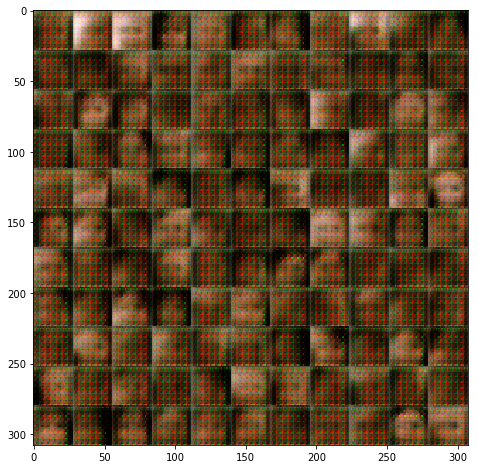

Epoch 1/1... Batch 55 Discriminator Loss: 1.2676... Generator Loss: 1.0002
Epoch 1/1... Batch 60 Discriminator Loss: 2.9042... Generator Loss: 0.1057
Epoch 1/1... Batch 65 Discriminator Loss: 1.6713... Generator Loss: 1.5206
Epoch 1/1... Batch 70 Discriminator Loss: 1.3494... Generator Loss: 0.8217
Epoch 1/1... Batch 75 Discriminator Loss: 1.2379... Generator Loss: 0.9384
Epoch 1/1... Batch 80 Discriminator Loss: 1.3275... Generator Loss: 1.0889
Epoch 1/1... Batch 85 Discriminator Loss: 1.1764... Generator Loss: 1.0069
Epoch 1/1... Batch 90 Discriminator Loss: 1.4272... Generator Loss: 0.8118
Epoch 1/1... Batch 95 Discriminator Loss: 1.2750... Generator Loss: 0.7908
Epoch 1/1... Batch 100 Discriminator Loss: 1.2213... Generator Loss: 0.7937


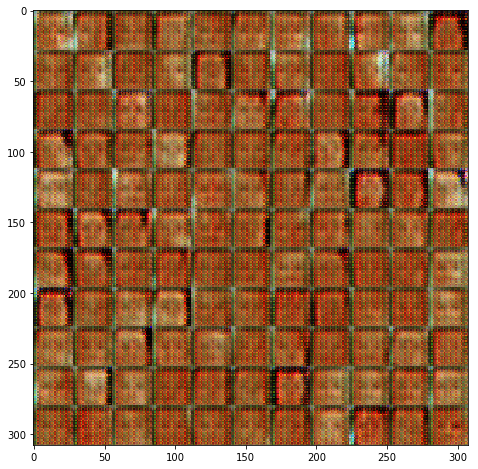

Epoch 1/1... Batch 105 Discriminator Loss: 0.9474... Generator Loss: 1.3403
Epoch 1/1... Batch 110 Discriminator Loss: 2.1446... Generator Loss: 2.6638
Epoch 1/1... Batch 115 Discriminator Loss: 1.3461... Generator Loss: 0.7429
Epoch 1/1... Batch 120 Discriminator Loss: 1.2099... Generator Loss: 0.8922
Epoch 1/1... Batch 125 Discriminator Loss: 1.2906... Generator Loss: 1.3397
Epoch 1/1... Batch 130 Discriminator Loss: 1.3331... Generator Loss: 0.6441
Epoch 1/1... Batch 135 Discriminator Loss: 1.5569... Generator Loss: 0.5413
Epoch 1/1... Batch 140 Discriminator Loss: 1.1906... Generator Loss: 0.8137
Epoch 1/1... Batch 145 Discriminator Loss: 1.4389... Generator Loss: 0.5123
Epoch 1/1... Batch 150 Discriminator Loss: 1.6315... Generator Loss: 0.4349


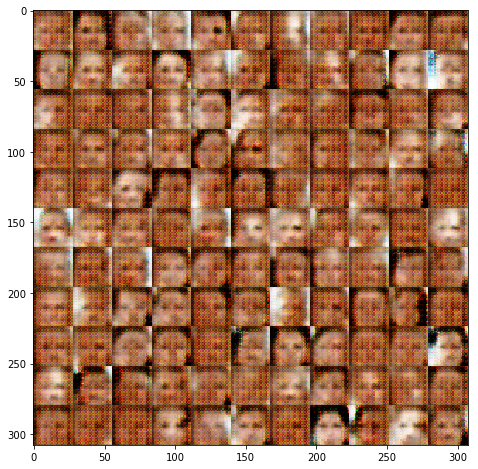

Epoch 1/1... Batch 155 Discriminator Loss: 0.8447... Generator Loss: 1.1737
Epoch 1/1... Batch 160 Discriminator Loss: 0.8228... Generator Loss: 1.0925
Epoch 1/1... Batch 165 Discriminator Loss: 0.6723... Generator Loss: 1.5254
Epoch 1/1... Batch 170 Discriminator Loss: 2.8466... Generator Loss: 0.1310
Epoch 1/1... Batch 175 Discriminator Loss: 1.1376... Generator Loss: 0.8169
Epoch 1/1... Batch 180 Discriminator Loss: 0.6879... Generator Loss: 2.0030
Epoch 1/1... Batch 185 Discriminator Loss: 0.7504... Generator Loss: 1.2440
Epoch 1/1... Batch 190 Discriminator Loss: 1.3937... Generator Loss: 0.5745
Epoch 1/1... Batch 195 Discriminator Loss: 0.8625... Generator Loss: 1.5295
Epoch 1/1... Batch 200 Discriminator Loss: 1.0836... Generator Loss: 1.5751


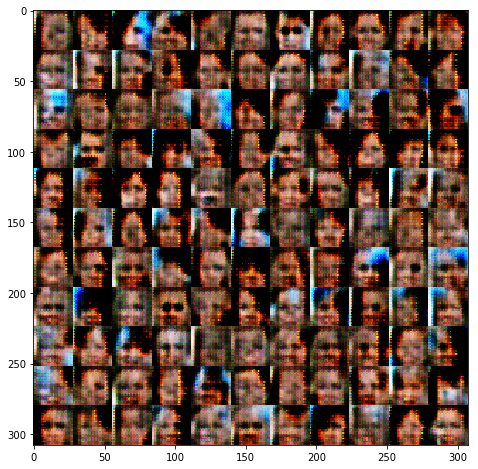

Epoch 1/1... Batch 205 Discriminator Loss: 1.1655... Generator Loss: 0.8175
Epoch 1/1... Batch 210 Discriminator Loss: 1.2999... Generator Loss: 1.7696
Epoch 1/1... Batch 215 Discriminator Loss: 0.5491... Generator Loss: 1.9606
Epoch 1/1... Batch 220 Discriminator Loss: 3.1488... Generator Loss: 0.1106
Epoch 1/1... Batch 225 Discriminator Loss: 0.5897... Generator Loss: 2.3984
Epoch 1/1... Batch 230 Discriminator Loss: 0.9140... Generator Loss: 1.4095
Epoch 1/1... Batch 235 Discriminator Loss: 0.5671... Generator Loss: 1.9275
Epoch 1/1... Batch 240 Discriminator Loss: 1.0380... Generator Loss: 1.2870
Epoch 1/1... Batch 245 Discriminator Loss: 0.6990... Generator Loss: 1.4159
Epoch 1/1... Batch 250 Discriminator Loss: 1.3362... Generator Loss: 0.9030


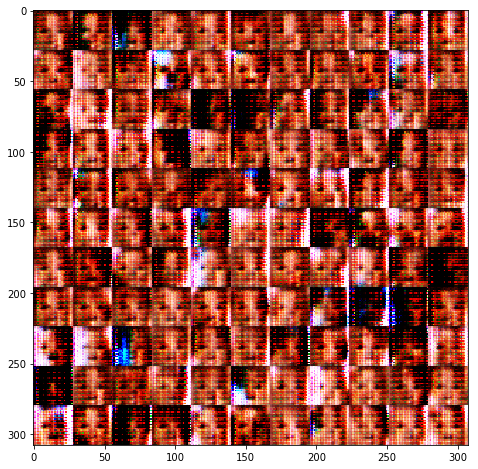

Epoch 1/1... Batch 255 Discriminator Loss: 0.9716... Generator Loss: 0.9407
Epoch 1/1... Batch 260 Discriminator Loss: 0.9878... Generator Loss: 1.0020
Epoch 1/1... Batch 265 Discriminator Loss: 0.6437... Generator Loss: 2.6358
Epoch 1/1... Batch 270 Discriminator Loss: 0.7099... Generator Loss: 1.3099
Epoch 1/1... Batch 275 Discriminator Loss: 1.0205... Generator Loss: 2.3000
Epoch 1/1... Batch 280 Discriminator Loss: 0.4043... Generator Loss: 3.3356
Epoch 1/1... Batch 285 Discriminator Loss: 0.6348... Generator Loss: 1.6860
Epoch 1/1... Batch 290 Discriminator Loss: 0.9919... Generator Loss: 2.5531
Epoch 1/1... Batch 295 Discriminator Loss: 1.1735... Generator Loss: 0.6728
Epoch 1/1... Batch 300 Discriminator Loss: 0.7955... Generator Loss: 1.8106


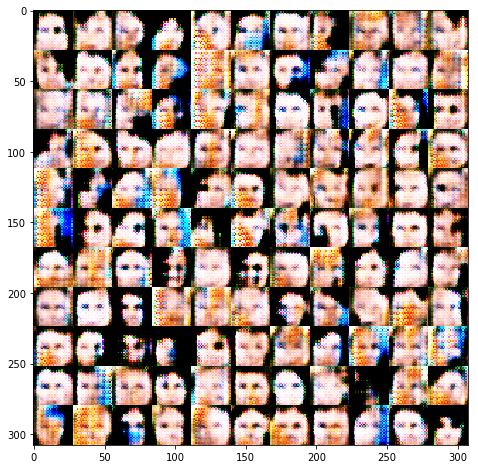

Epoch 1/1... Batch 305 Discriminator Loss: 0.9568... Generator Loss: 1.0331
Epoch 1/1... Batch 310 Discriminator Loss: 0.8931... Generator Loss: 1.7929
Epoch 1/1... Batch 315 Discriminator Loss: 0.6869... Generator Loss: 1.8325
Epoch 1/1... Batch 320 Discriminator Loss: 0.9706... Generator Loss: 1.0059
Epoch 1/1... Batch 325 Discriminator Loss: 1.3491... Generator Loss: 0.6819
Epoch 1/1... Batch 330 Discriminator Loss: 1.0054... Generator Loss: 0.8850
Epoch 1/1... Batch 335 Discriminator Loss: 1.0373... Generator Loss: 2.3459
Epoch 1/1... Batch 340 Discriminator Loss: 0.6953... Generator Loss: 1.7806
Epoch 1/1... Batch 345 Discriminator Loss: 1.1108... Generator Loss: 1.0733
Epoch 1/1... Batch 350 Discriminator Loss: 0.7600... Generator Loss: 1.2082


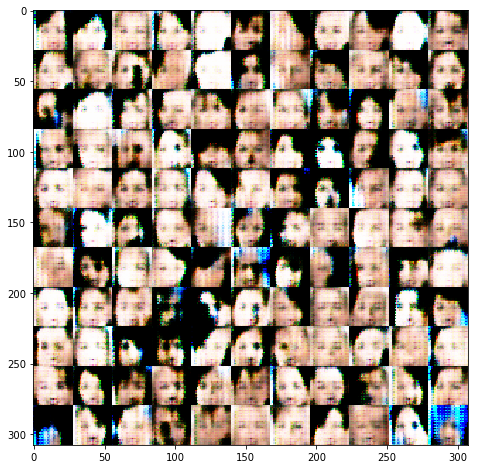

Epoch 1/1... Batch 355 Discriminator Loss: 0.9197... Generator Loss: 1.2243
Epoch 1/1... Batch 360 Discriminator Loss: 1.0332... Generator Loss: 1.0712
Epoch 1/1... Batch 365 Discriminator Loss: 1.4258... Generator Loss: 2.2550
Epoch 1/1... Batch 370 Discriminator Loss: 1.6311... Generator Loss: 2.2299
Epoch 1/1... Batch 375 Discriminator Loss: 0.5372... Generator Loss: 2.7100
Epoch 1/1... Batch 380 Discriminator Loss: 1.0688... Generator Loss: 0.7620
Epoch 1/1... Batch 385 Discriminator Loss: 1.2199... Generator Loss: 0.6914
Epoch 1/1... Batch 390 Discriminator Loss: 1.0055... Generator Loss: 1.0349
Epoch 1/1... Batch 395 Discriminator Loss: 1.1392... Generator Loss: 1.0261
Epoch 1/1... Batch 400 Discriminator Loss: 1.0978... Generator Loss: 0.8212


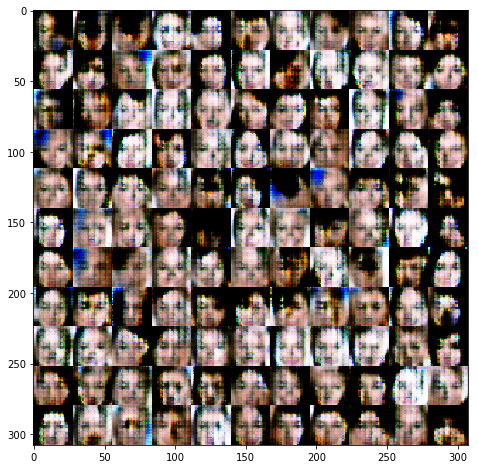

Epoch 1/1... Batch 405 Discriminator Loss: 0.9980... Generator Loss: 1.0008
Epoch 1/1... Batch 410 Discriminator Loss: 1.0830... Generator Loss: 1.1584
Epoch 1/1... Batch 415 Discriminator Loss: 1.0549... Generator Loss: 1.2747
Epoch 1/1... Batch 420 Discriminator Loss: 0.9416... Generator Loss: 1.0740
Epoch 1/1... Batch 425 Discriminator Loss: 0.8197... Generator Loss: 1.7644
Epoch 1/1... Batch 430 Discriminator Loss: 0.6617... Generator Loss: 2.5061
Epoch 1/1... Batch 435 Discriminator Loss: 1.5902... Generator Loss: 0.4589
Epoch 1/1... Batch 440 Discriminator Loss: 0.8062... Generator Loss: 1.6390
Epoch 1/1... Batch 445 Discriminator Loss: 1.0843... Generator Loss: 1.2413
Epoch 1/1... Batch 450 Discriminator Loss: 0.9510... Generator Loss: 0.9650


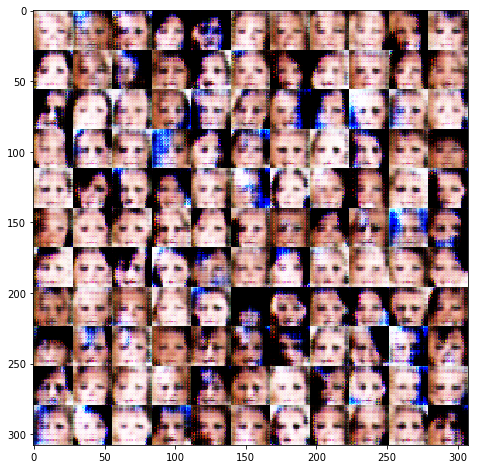

Epoch 1/1... Batch 455 Discriminator Loss: 0.9501... Generator Loss: 0.8441
Epoch 1/1... Batch 460 Discriminator Loss: 0.7021... Generator Loss: 1.4572
Epoch 1/1... Batch 465 Discriminator Loss: 0.6902... Generator Loss: 2.4510
Epoch 1/1... Batch 470 Discriminator Loss: 0.8703... Generator Loss: 2.1340
Epoch 1/1... Batch 475 Discriminator Loss: 1.0810... Generator Loss: 0.9427
Epoch 1/1... Batch 480 Discriminator Loss: 0.9940... Generator Loss: 0.9918
Epoch 1/1... Batch 485 Discriminator Loss: 1.0384... Generator Loss: 0.7755
Epoch 1/1... Batch 490 Discriminator Loss: 1.5501... Generator Loss: 0.4491
Epoch 1/1... Batch 495 Discriminator Loss: 0.9281... Generator Loss: 1.3457
Epoch 1/1... Batch 500 Discriminator Loss: 1.1140... Generator Loss: 0.7926


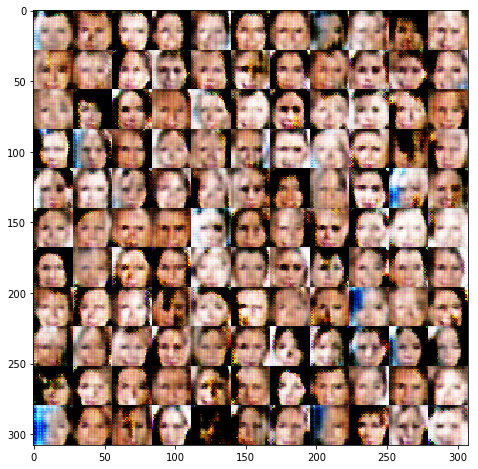

Epoch 1/1... Batch 505 Discriminator Loss: 0.8889... Generator Loss: 2.1601
Epoch 1/1... Batch 510 Discriminator Loss: 0.9194... Generator Loss: 1.0206
Epoch 1/1... Batch 515 Discriminator Loss: 1.1772... Generator Loss: 2.6430
Epoch 1/1... Batch 520 Discriminator Loss: 0.9557... Generator Loss: 1.9989
Epoch 1/1... Batch 525 Discriminator Loss: 1.4492... Generator Loss: 0.6176
Epoch 1/1... Batch 530 Discriminator Loss: 0.9604... Generator Loss: 1.2398
Epoch 1/1... Batch 535 Discriminator Loss: 1.1330... Generator Loss: 0.7720
Epoch 1/1... Batch 540 Discriminator Loss: 1.7707... Generator Loss: 2.8216
Epoch 1/1... Batch 545 Discriminator Loss: 0.9546... Generator Loss: 1.0799
Epoch 1/1... Batch 550 Discriminator Loss: 1.4706... Generator Loss: 0.5502


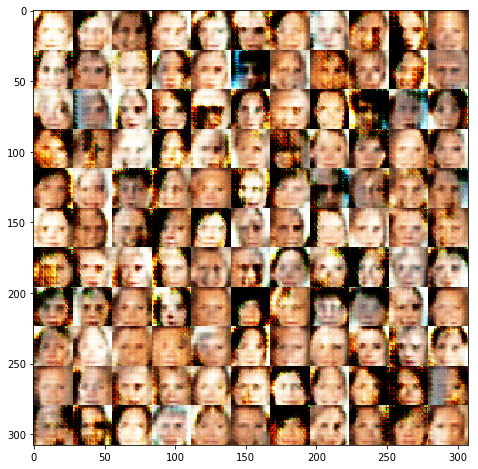

Epoch 1/1... Batch 555 Discriminator Loss: 1.1450... Generator Loss: 1.1532
Epoch 1/1... Batch 560 Discriminator Loss: 2.2289... Generator Loss: 0.2403
Epoch 1/1... Batch 565 Discriminator Loss: 0.8897... Generator Loss: 1.0022
Epoch 1/1... Batch 570 Discriminator Loss: 1.2401... Generator Loss: 1.3257
Epoch 1/1... Batch 575 Discriminator Loss: 1.2751... Generator Loss: 1.0159
Epoch 1/1... Batch 580 Discriminator Loss: 1.4848... Generator Loss: 1.2966
Epoch 1/1... Batch 585 Discriminator Loss: 1.0491... Generator Loss: 1.1885
Epoch 1/1... Batch 590 Discriminator Loss: 0.8868... Generator Loss: 1.0845
Epoch 1/1... Batch 595 Discriminator Loss: 1.4144... Generator Loss: 1.8933
Epoch 1/1... Batch 600 Discriminator Loss: 1.0248... Generator Loss: 0.9150


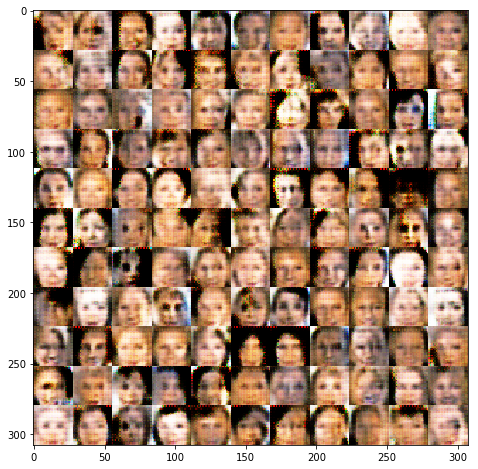

Epoch 1/1... Batch 605 Discriminator Loss: 1.1501... Generator Loss: 2.3401
Epoch 1/1... Batch 610 Discriminator Loss: 1.0516... Generator Loss: 0.8766
Epoch 1/1... Batch 615 Discriminator Loss: 1.1689... Generator Loss: 1.0326
Epoch 1/1... Batch 620 Discriminator Loss: 0.8473... Generator Loss: 1.1541
Epoch 1/1... Batch 625 Discriminator Loss: 1.3315... Generator Loss: 1.4106
Epoch 1/1... Batch 630 Discriminator Loss: 1.3476... Generator Loss: 2.0564
Epoch 1/1... Batch 635 Discriminator Loss: 0.8892... Generator Loss: 1.5398
Epoch 1/1... Batch 640 Discriminator Loss: 1.1496... Generator Loss: 0.8469
Epoch 1/1... Batch 645 Discriminator Loss: 1.0308... Generator Loss: 0.9912
Epoch 1/1... Batch 650 Discriminator Loss: 1.1541... Generator Loss: 1.8513


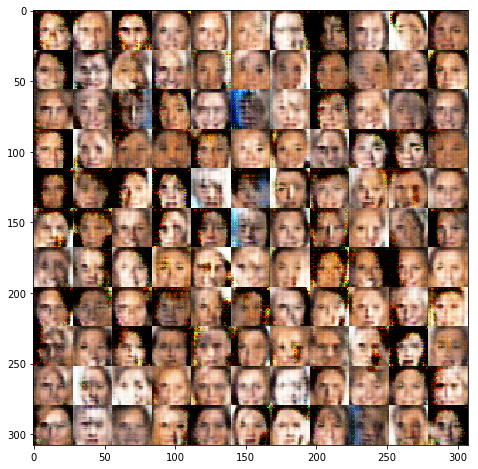

Epoch 1/1... Batch 655 Discriminator Loss: 1.2208... Generator Loss: 0.7790
Epoch 1/1... Batch 660 Discriminator Loss: 1.0635... Generator Loss: 0.7787
Epoch 1/1... Batch 665 Discriminator Loss: 0.7188... Generator Loss: 1.4555
Epoch 1/1... Batch 670 Discriminator Loss: 3.4004... Generator Loss: 5.5210
Epoch 1/1... Batch 675 Discriminator Loss: 1.0800... Generator Loss: 1.0379
Epoch 1/1... Batch 680 Discriminator Loss: 1.4813... Generator Loss: 1.1540
Epoch 1/1... Batch 685 Discriminator Loss: 1.0548... Generator Loss: 1.7041
Epoch 1/1... Batch 690 Discriminator Loss: 1.4038... Generator Loss: 0.7102
Epoch 1/1... Batch 695 Discriminator Loss: 1.0969... Generator Loss: 0.8615
Epoch 1/1... Batch 700 Discriminator Loss: 1.2412... Generator Loss: 1.1792


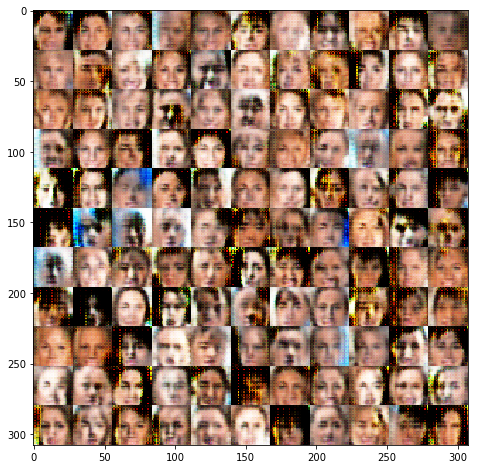

Epoch 1/1... Batch 705 Discriminator Loss: 1.0262... Generator Loss: 1.2075
Epoch 1/1... Batch 710 Discriminator Loss: 1.2951... Generator Loss: 0.8960
Epoch 1/1... Batch 715 Discriminator Loss: 0.9205... Generator Loss: 1.1292
Epoch 1/1... Batch 720 Discriminator Loss: 1.9933... Generator Loss: 2.2755
Epoch 1/1... Batch 725 Discriminator Loss: 1.1605... Generator Loss: 0.8359
Epoch 1/1... Batch 730 Discriminator Loss: 1.1817... Generator Loss: 0.9807
Epoch 1/1... Batch 735 Discriminator Loss: 0.9921... Generator Loss: 1.1005
Epoch 1/1... Batch 740 Discriminator Loss: 1.1177... Generator Loss: 1.6373
Epoch 1/1... Batch 745 Discriminator Loss: 0.9781... Generator Loss: 1.1518
Epoch 1/1... Batch 750 Discriminator Loss: 1.1475... Generator Loss: 0.9975


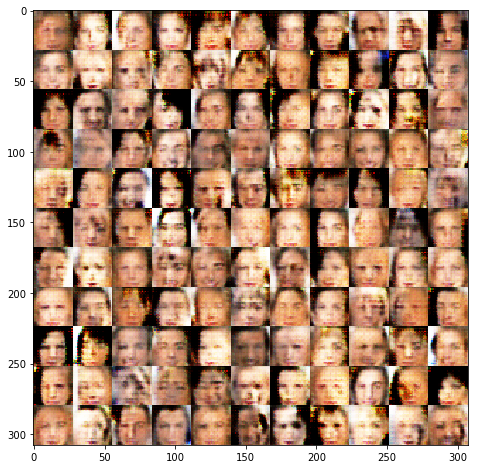

Epoch 1/1... Batch 755 Discriminator Loss: 0.7583... Generator Loss: 1.2737
Epoch 1/1... Batch 760 Discriminator Loss: 1.4217... Generator Loss: 0.5907
Epoch 1/1... Batch 765 Discriminator Loss: 0.7630... Generator Loss: 1.1621
Epoch 1/1... Batch 770 Discriminator Loss: 1.2648... Generator Loss: 3.5305
Epoch 1/1... Batch 775 Discriminator Loss: 2.6706... Generator Loss: 2.8808
Epoch 1/1... Batch 780 Discriminator Loss: 1.3304... Generator Loss: 0.9066
Epoch 1/1... Batch 785 Discriminator Loss: 0.9420... Generator Loss: 1.1249
Epoch 1/1... Batch 790 Discriminator Loss: 1.1996... Generator Loss: 0.9962
Epoch 1/1... Batch 795 Discriminator Loss: 0.9635... Generator Loss: 0.8813
Epoch 1/1... Batch 800 Discriminator Loss: 0.8099... Generator Loss: 1.1234


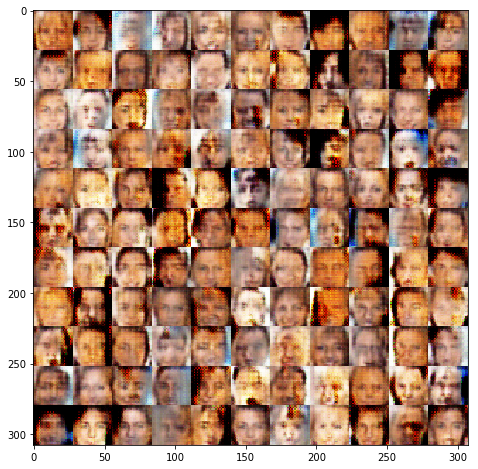

Epoch 1/1... Batch 805 Discriminator Loss: 1.2124... Generator Loss: 1.9381
Epoch 1/1... Batch 810 Discriminator Loss: 1.0638... Generator Loss: 1.3508
Epoch 1/1... Batch 815 Discriminator Loss: 0.9635... Generator Loss: 1.6295
Epoch 1/1... Batch 820 Discriminator Loss: 1.0983... Generator Loss: 1.9449
Epoch 1/1... Batch 825 Discriminator Loss: 0.9812... Generator Loss: 1.3198
Epoch 1/1... Batch 830 Discriminator Loss: 1.2841... Generator Loss: 0.7661
Epoch 1/1... Batch 835 Discriminator Loss: 1.1595... Generator Loss: 0.9882
Epoch 1/1... Batch 840 Discriminator Loss: 1.2562... Generator Loss: 0.8676
Epoch 1/1... Batch 845 Discriminator Loss: 1.3449... Generator Loss: 2.3439
Epoch 1/1... Batch 850 Discriminator Loss: 1.1616... Generator Loss: 1.0918


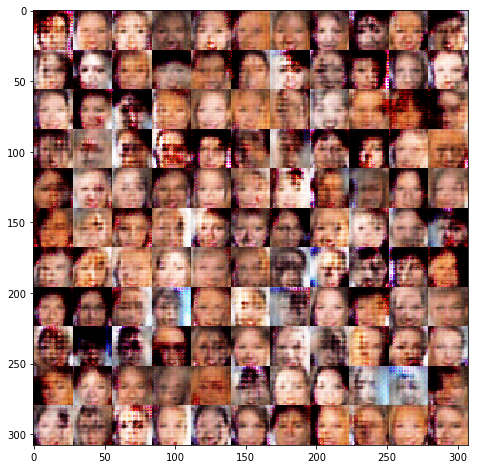

Epoch 1/1... Batch 855 Discriminator Loss: 1.0488... Generator Loss: 1.5817
Epoch 1/1... Batch 860 Discriminator Loss: 1.0009... Generator Loss: 1.2510
Epoch 1/1... Batch 865 Discriminator Loss: 1.2880... Generator Loss: 0.6418
Epoch 1/1... Batch 870 Discriminator Loss: 1.1169... Generator Loss: 0.9178
Epoch 1/1... Batch 875 Discriminator Loss: 1.0191... Generator Loss: 0.9238
Epoch 1/1... Batch 880 Discriminator Loss: 1.1303... Generator Loss: 1.8037
Epoch 1/1... Batch 885 Discriminator Loss: 1.1588... Generator Loss: 0.9683
Epoch 1/1... Batch 890 Discriminator Loss: 0.8437... Generator Loss: 1.2514
Epoch 1/1... Batch 895 Discriminator Loss: 1.5500... Generator Loss: 2.1628
Epoch 1/1... Batch 900 Discriminator Loss: 1.1580... Generator Loss: 1.0398


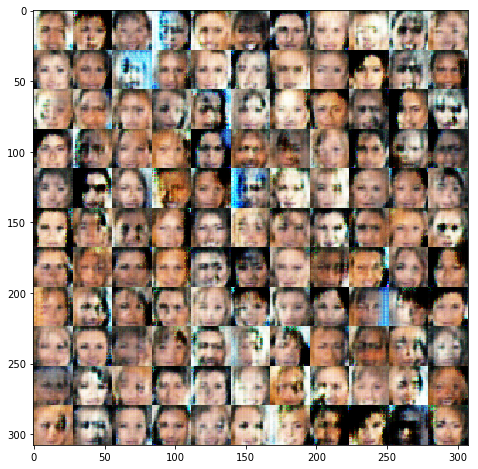

Epoch 1/1... Batch 905 Discriminator Loss: 0.9209... Generator Loss: 0.9550
Epoch 1/1... Batch 910 Discriminator Loss: 0.9329... Generator Loss: 0.9855
Epoch 1/1... Batch 915 Discriminator Loss: 1.0228... Generator Loss: 1.1247
Epoch 1/1... Batch 920 Discriminator Loss: 1.1191... Generator Loss: 1.0177
Epoch 1/1... Batch 925 Discriminator Loss: 1.0357... Generator Loss: 0.7638
Epoch 1/1... Batch 930 Discriminator Loss: 0.9959... Generator Loss: 0.9379
Epoch 1/1... Batch 935 Discriminator Loss: 1.5011... Generator Loss: 1.8431
Epoch 1/1... Batch 940 Discriminator Loss: 0.9957... Generator Loss: 1.0118
Epoch 1/1... Batch 945 Discriminator Loss: 1.3747... Generator Loss: 0.7203
Epoch 1/1... Batch 950 Discriminator Loss: 1.2395... Generator Loss: 0.7549


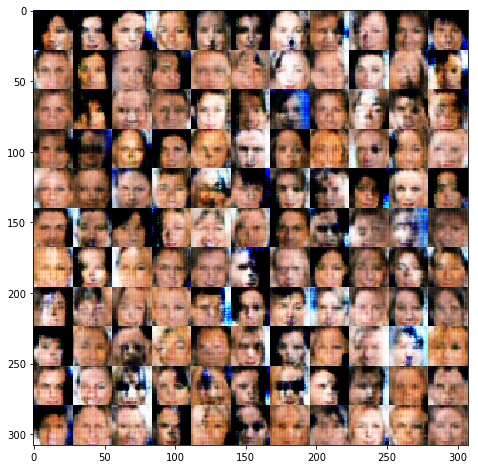

Epoch 1/1... Batch 955 Discriminator Loss: 1.2100... Generator Loss: 1.2843
Epoch 1/1... Batch 960 Discriminator Loss: 1.2267... Generator Loss: 1.5527
Epoch 1/1... Batch 965 Discriminator Loss: 1.0501... Generator Loss: 1.0968
Epoch 1/1... Batch 970 Discriminator Loss: 1.3257... Generator Loss: 1.0305
Epoch 1/1... Batch 975 Discriminator Loss: 1.1539... Generator Loss: 0.8393
Epoch 1/1... Batch 980 Discriminator Loss: 1.3479... Generator Loss: 1.1207
Epoch 1/1... Batch 985 Discriminator Loss: 1.0745... Generator Loss: 1.2649
Epoch 1/1... Batch 990 Discriminator Loss: 1.2085... Generator Loss: 0.9016
Epoch 1/1... Batch 995 Discriminator Loss: 1.1067... Generator Loss: 1.2040
Epoch 1/1... Batch 1000 Discriminator Loss: 1.1450... Generator Loss: 1.7087


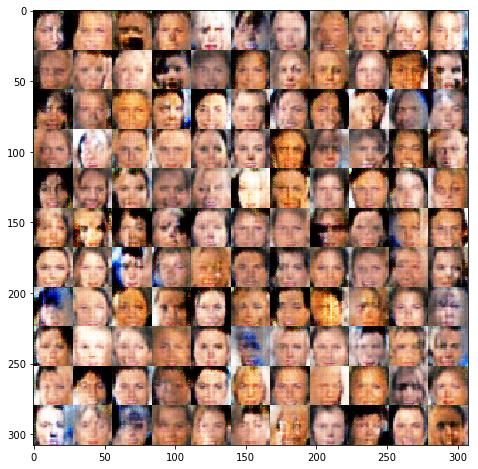

Epoch 1/1... Batch 1005 Discriminator Loss: 1.2119... Generator Loss: 1.5191
Epoch 1/1... Batch 1010 Discriminator Loss: 1.1049... Generator Loss: 0.8420
Epoch 1/1... Batch 1015 Discriminator Loss: 1.1216... Generator Loss: 0.8427
Epoch 1/1... Batch 1020 Discriminator Loss: 1.3438... Generator Loss: 0.7017
Epoch 1/1... Batch 1025 Discriminator Loss: 0.9937... Generator Loss: 0.9142
Epoch 1/1... Batch 1030 Discriminator Loss: 1.2627... Generator Loss: 0.8220
Epoch 1/1... Batch 1035 Discriminator Loss: 1.2845... Generator Loss: 1.3772
Epoch 1/1... Batch 1040 Discriminator Loss: 1.0469... Generator Loss: 0.8277
Epoch 1/1... Batch 1045 Discriminator Loss: 1.1459... Generator Loss: 1.2535
Epoch 1/1... Batch 1050 Discriminator Loss: 1.0473... Generator Loss: 0.8202


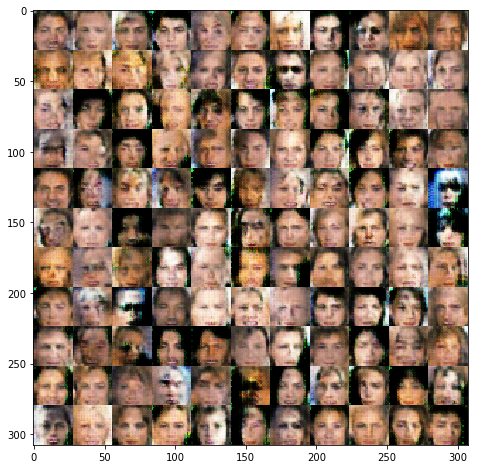

Epoch 1/1... Batch 1055 Discriminator Loss: 2.4248... Generator Loss: 0.1880
Epoch 1/1... Batch 1060 Discriminator Loss: 1.0111... Generator Loss: 1.1240
Epoch 1/1... Batch 1065 Discriminator Loss: 1.0937... Generator Loss: 1.1009
Epoch 1/1... Batch 1070 Discriminator Loss: 1.0968... Generator Loss: 1.2468
Epoch 1/1... Batch 1075 Discriminator Loss: 1.2004... Generator Loss: 1.6244
Epoch 1/1... Batch 1080 Discriminator Loss: 1.5681... Generator Loss: 0.4441
Epoch 1/1... Batch 1085 Discriminator Loss: 1.1706... Generator Loss: 1.4390
Epoch 1/1... Batch 1090 Discriminator Loss: 1.5594... Generator Loss: 0.5903
Epoch 1/1... Batch 1095 Discriminator Loss: 1.1126... Generator Loss: 0.8289
Epoch 1/1... Batch 1100 Discriminator Loss: 1.3513... Generator Loss: 0.9054


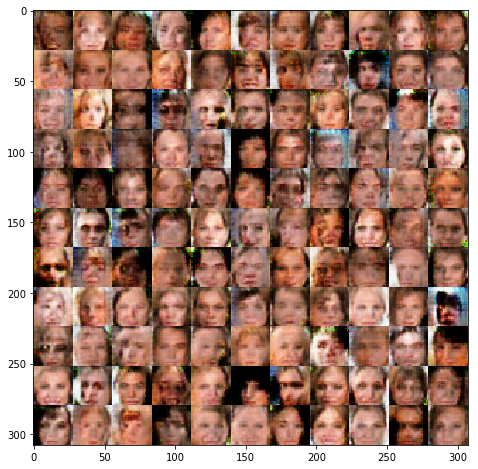

Epoch 1/1... Batch 1105 Discriminator Loss: 1.7387... Generator Loss: 1.9789
Epoch 1/1... Batch 1110 Discriminator Loss: 1.0750... Generator Loss: 0.9895
Epoch 1/1... Batch 1115 Discriminator Loss: 1.2252... Generator Loss: 0.7262
Epoch 1/1... Batch 1120 Discriminator Loss: 1.3174... Generator Loss: 0.7001
Epoch 1/1... Batch 1125 Discriminator Loss: 1.4026... Generator Loss: 0.6724
Epoch 1/1... Batch 1130 Discriminator Loss: 1.2616... Generator Loss: 0.9594
Epoch 1/1... Batch 1135 Discriminator Loss: 1.0833... Generator Loss: 0.9652
Epoch 1/1... Batch 1140 Discriminator Loss: 1.0397... Generator Loss: 0.7521
Epoch 1/1... Batch 1145 Discriminator Loss: 1.2403... Generator Loss: 0.5946
Epoch 1/1... Batch 1150 Discriminator Loss: 1.1907... Generator Loss: 1.8824


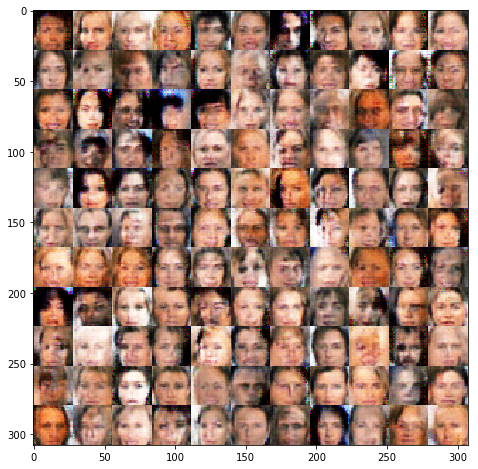

Epoch 1/1... Batch 1155 Discriminator Loss: 1.1634... Generator Loss: 0.8948
Epoch 1/1... Batch 1160 Discriminator Loss: 1.1593... Generator Loss: 1.5998
Epoch 1/1... Batch 1165 Discriminator Loss: 1.0792... Generator Loss: 0.8059
Epoch 1/1... Batch 1170 Discriminator Loss: 1.1823... Generator Loss: 1.7377
Epoch 1/1... Batch 1175 Discriminator Loss: 1.3466... Generator Loss: 2.1622
Epoch 1/1... Batch 1180 Discriminator Loss: 1.5251... Generator Loss: 0.6017
Epoch 1/1... Batch 1185 Discriminator Loss: 1.2015... Generator Loss: 0.9723
Epoch 1/1... Batch 1190 Discriminator Loss: 1.0495... Generator Loss: 0.8943
Epoch 1/1... Batch 1195 Discriminator Loss: 1.2021... Generator Loss: 0.8687
Epoch 1/1... Batch 1200 Discriminator Loss: 1.0678... Generator Loss: 1.2210


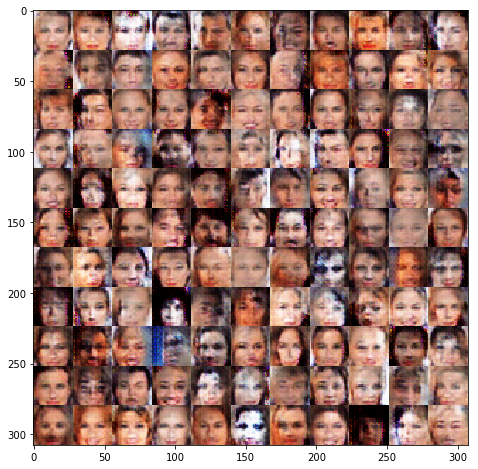

Epoch 1/1... Batch 1205 Discriminator Loss: 1.0380... Generator Loss: 0.9266
Epoch 1/1... Batch 1210 Discriminator Loss: 1.4151... Generator Loss: 2.2551
Epoch 1/1... Batch 1215 Discriminator Loss: 0.9182... Generator Loss: 0.9618
Epoch 1/1... Batch 1220 Discriminator Loss: 1.3420... Generator Loss: 1.5372
Epoch 1/1... Batch 1225 Discriminator Loss: 1.3417... Generator Loss: 0.8234
Epoch 1/1... Batch 1230 Discriminator Loss: 1.0367... Generator Loss: 0.9242
Epoch 1/1... Batch 1235 Discriminator Loss: 1.1309... Generator Loss: 0.7888
Epoch 1/1... Batch 1240 Discriminator Loss: 1.1179... Generator Loss: 0.8015
Epoch 1/1... Batch 1245 Discriminator Loss: 1.0675... Generator Loss: 1.4785
Epoch 1/1... Batch 1250 Discriminator Loss: 1.4383... Generator Loss: 0.5298


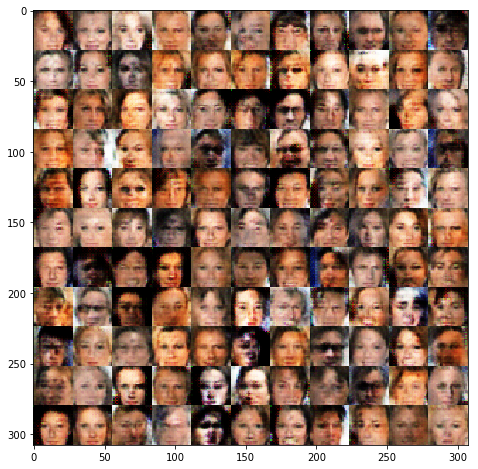

Epoch 1/1... Batch 1255 Discriminator Loss: 1.9432... Generator Loss: 3.0704
Epoch 1/1... Batch 1260 Discriminator Loss: 1.2005... Generator Loss: 0.9355
Epoch 1/1... Batch 1265 Discriminator Loss: 1.1795... Generator Loss: 0.8513
Epoch 1/1... Batch 1270 Discriminator Loss: 1.1843... Generator Loss: 0.8936
Epoch 1/1... Batch 1275 Discriminator Loss: 1.3397... Generator Loss: 0.6218
Epoch 1/1... Batch 1280 Discriminator Loss: 1.1629... Generator Loss: 0.8059
Epoch 1/1... Batch 1285 Discriminator Loss: 1.0681... Generator Loss: 1.5662
Epoch 1/1... Batch 1290 Discriminator Loss: 1.1929... Generator Loss: 1.0291
Epoch 1/1... Batch 1295 Discriminator Loss: 1.2921... Generator Loss: 0.7081
Epoch 1/1... Batch 1300 Discriminator Loss: 1.1117... Generator Loss: 1.0383


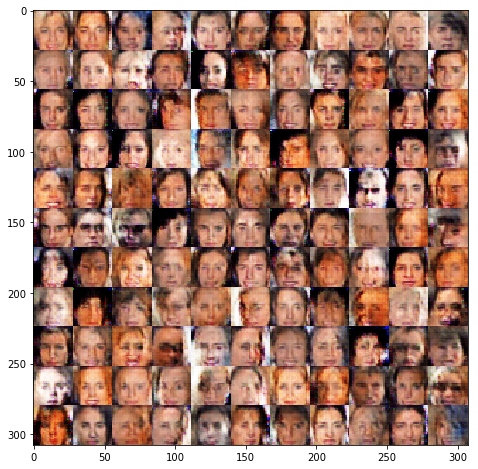

Epoch 1/1... Batch 1305 Discriminator Loss: 1.3328... Generator Loss: 0.5815
Epoch 1/1... Batch 1310 Discriminator Loss: 1.1035... Generator Loss: 1.4985
Epoch 1/1... Batch 1315 Discriminator Loss: 1.2470... Generator Loss: 0.6524
Epoch 1/1... Batch 1320 Discriminator Loss: 1.2379... Generator Loss: 1.5003
Epoch 1/1... Batch 1325 Discriminator Loss: 1.0584... Generator Loss: 1.0558
Epoch 1/1... Batch 1330 Discriminator Loss: 0.9557... Generator Loss: 1.0015
Epoch 1/1... Batch 1335 Discriminator Loss: 1.0325... Generator Loss: 0.9797
Epoch 1/1... Batch 1340 Discriminator Loss: 1.0393... Generator Loss: 1.4494
Epoch 1/1... Batch 1345 Discriminator Loss: 1.0029... Generator Loss: 1.1418
Epoch 1/1... Batch 1350 Discriminator Loss: 1.3629... Generator Loss: 0.8486


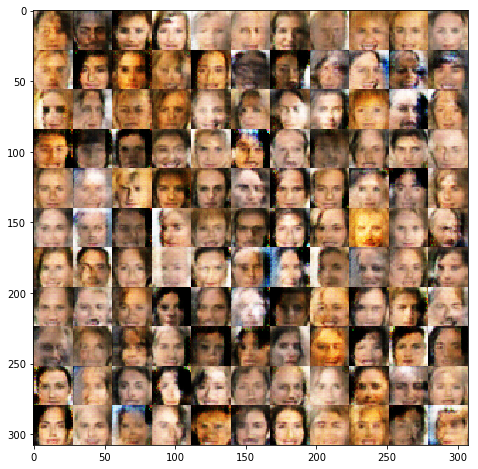

Epoch 1/1... Batch 1355 Discriminator Loss: 1.1971... Generator Loss: 1.1931
Epoch 1/1... Batch 1360 Discriminator Loss: 1.0088... Generator Loss: 0.9505
Epoch 1/1... Batch 1365 Discriminator Loss: 1.0213... Generator Loss: 1.3148
Epoch 1/1... Batch 1370 Discriminator Loss: 1.2905... Generator Loss: 1.1436
Epoch 1/1... Batch 1375 Discriminator Loss: 0.9232... Generator Loss: 1.0466
Epoch 1/1... Batch 1380 Discriminator Loss: 1.2065... Generator Loss: 0.7449
Epoch 1/1... Batch 1385 Discriminator Loss: 1.6475... Generator Loss: 0.5428
Epoch 1/1... Batch 1390 Discriminator Loss: 0.8926... Generator Loss: 1.2876
Epoch 1/1... Batch 1395 Discriminator Loss: 1.4031... Generator Loss: 1.9672
Epoch 1/1... Batch 1400 Discriminator Loss: 1.0423... Generator Loss: 0.8555


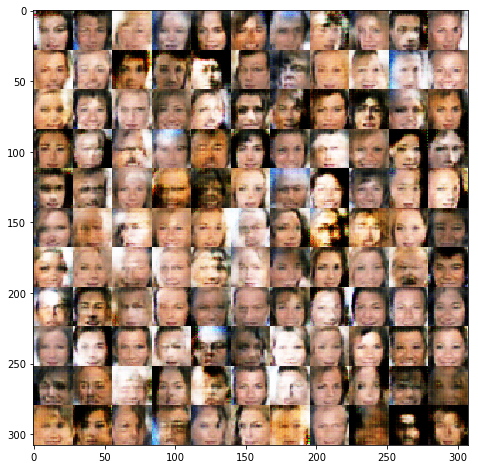

Epoch 1/1... Batch 1405 Discriminator Loss: 0.8981... Generator Loss: 1.2542
Epoch 1/1... Batch 1410 Discriminator Loss: 1.1448... Generator Loss: 0.8938
Epoch 1/1... Batch 1415 Discriminator Loss: 1.6865... Generator Loss: 0.8814
Epoch 1/1... Batch 1420 Discriminator Loss: 1.5805... Generator Loss: 0.4100
Epoch 1/1... Batch 1425 Discriminator Loss: 1.0512... Generator Loss: 1.0018
Epoch 1/1... Batch 1430 Discriminator Loss: 1.3497... Generator Loss: 0.7815
Epoch 1/1... Batch 1435 Discriminator Loss: 1.1437... Generator Loss: 0.8810
Epoch 1/1... Batch 1440 Discriminator Loss: 1.1482... Generator Loss: 1.4515
Epoch 1/1... Batch 1445 Discriminator Loss: 1.1969... Generator Loss: 1.1038
Epoch 1/1... Batch 1450 Discriminator Loss: 1.2994... Generator Loss: 1.1290


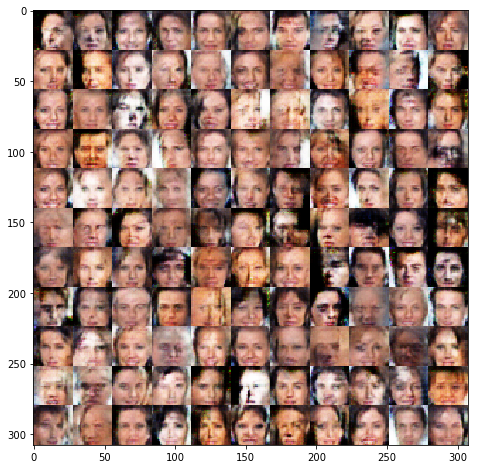

Epoch 1/1... Batch 1455 Discriminator Loss: 1.0876... Generator Loss: 1.2689
Epoch 1/1... Batch 1460 Discriminator Loss: 1.2306... Generator Loss: 1.0554
Epoch 1/1... Batch 1465 Discriminator Loss: 0.9860... Generator Loss: 0.9443
Epoch 1/1... Batch 1470 Discriminator Loss: 1.2042... Generator Loss: 0.9134
Epoch 1/1... Batch 1475 Discriminator Loss: 1.1206... Generator Loss: 0.8171
Epoch 1/1... Batch 1480 Discriminator Loss: 0.6060... Generator Loss: 2.1125
Epoch 1/1... Batch 1485 Discriminator Loss: 0.9978... Generator Loss: 1.1205
Epoch 1/1... Batch 1490 Discriminator Loss: 1.3353... Generator Loss: 1.4235
Epoch 1/1... Batch 1495 Discriminator Loss: 1.0208... Generator Loss: 1.0057
Epoch 1/1... Batch 1500 Discriminator Loss: 1.1217... Generator Loss: 0.9338


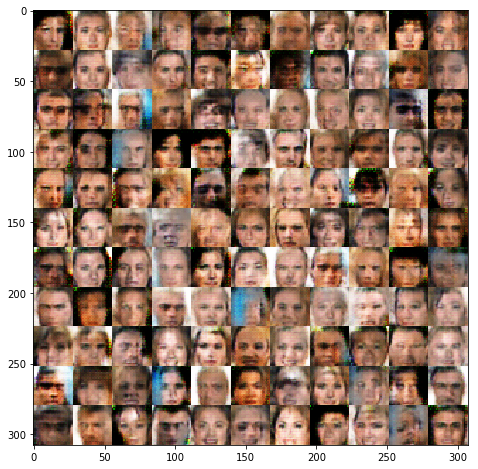

Epoch 1/1... Batch 1505 Discriminator Loss: 1.2343... Generator Loss: 0.9520
Epoch 1/1... Batch 1510 Discriminator Loss: 1.0178... Generator Loss: 0.9790
Epoch 1/1... Batch 1515 Discriminator Loss: 0.8130... Generator Loss: 1.1862
Epoch 1/1... Batch 1520 Discriminator Loss: 1.0438... Generator Loss: 1.1858
Epoch 1/1... Batch 1525 Discriminator Loss: 1.0722... Generator Loss: 1.5474
Epoch 1/1... Batch 1530 Discriminator Loss: 1.2334... Generator Loss: 0.6798
Epoch 1/1... Batch 1535 Discriminator Loss: 1.4865... Generator Loss: 0.7053
Epoch 1/1... Batch 1540 Discriminator Loss: 0.9952... Generator Loss: 1.3552
Epoch 1/1... Batch 1545 Discriminator Loss: 1.1886... Generator Loss: 1.0226
Epoch 1/1... Batch 1550 Discriminator Loss: 1.0247... Generator Loss: 1.0997


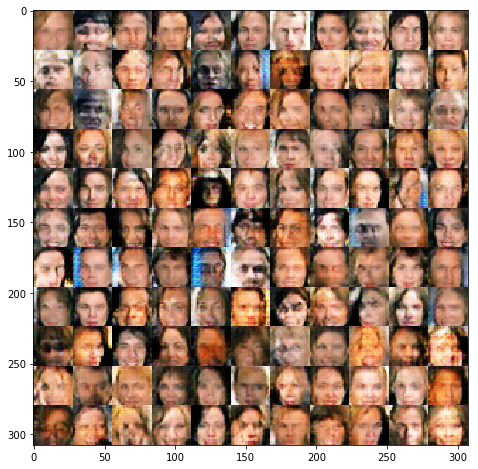

Epoch 1/1... Batch 1555 Discriminator Loss: 1.2872... Generator Loss: 1.7036
Epoch 1/1... Batch 1560 Discriminator Loss: 1.0479... Generator Loss: 1.1036
Epoch 1/1... Batch 1565 Discriminator Loss: 1.2570... Generator Loss: 0.7068
Epoch 1/1... Batch 1570 Discriminator Loss: 1.0549... Generator Loss: 1.0983
Epoch 1/1... Batch 1575 Discriminator Loss: 1.0263... Generator Loss: 1.1658
Epoch 1/1... Batch 1580 Discriminator Loss: 0.9727... Generator Loss: 1.2571


In [13]:
batch_size = 128
z_dim = 100
learning_rate = 0.002
beta1 = 0.5
alpha_ = 0.1

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.